In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [100]:
df = pd.read_csv('\\Airbnb\\Data\\AB_NYC_2019.csv')

# Exploring Data

In [72]:
df.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355


In [73]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [74]:
list(df.columns.values)

['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [75]:
missing_df = pd.DataFrame(columns=['Attribute Name','Number of instances','Null Value Counts'])

In [76]:
for i,col in enumerate(df.columns):
    missing_ct = df[col].isnull().sum(axis=0)
    missing_df.loc[i] = [col,df.shape[0],missing_ct]


In [77]:
missing_df

,Attribute Name,Number of instances,Null Value Counts
0,id,48895,0
1,name,48895,16
2,host_id,48895,0
3,host_name,48895,21
4,neighbourhood_group,48895,0
5,neighbourhood,48895,0
6,latitude,48895,0
7,longitude,48895,0
8,room_type,48895,0
9,price,48895,0


In [78]:
#For Imputing Missing Values
#df[df['reviews_per_month'].notnull()].groupby(['neighbourhood','room_type']).agg({'number_of_reviews':['mean'],'room_type':['count']})

# Visualizing Data

### Distribution of different types of Rooms

In [79]:
fig = px.pie(df, values=df['room_type'].value_counts(), names=df['room_type'].value_counts().index, title='Distribution of different types of Rooms',\
            color_discrete_sequence=px.colors.sequential.Blues_r)
fig

## Neighbourhood Groups vs Number of Rooms

In [80]:
fig = px.bar(df, x = df['neighbourhood_group'].value_counts().index,y=df['neighbourhood_group'].value_counts(),\
             color_discrete_sequence=px.colors.sequential.Tealgrn_r,labels={'x':'Neigbourhood','y':'Number of Rooms'})
fig

## Neighbourhood Groups vs Number of Rooms(Room_Types)

Text(0, 0.5, 'Number of Rooms')

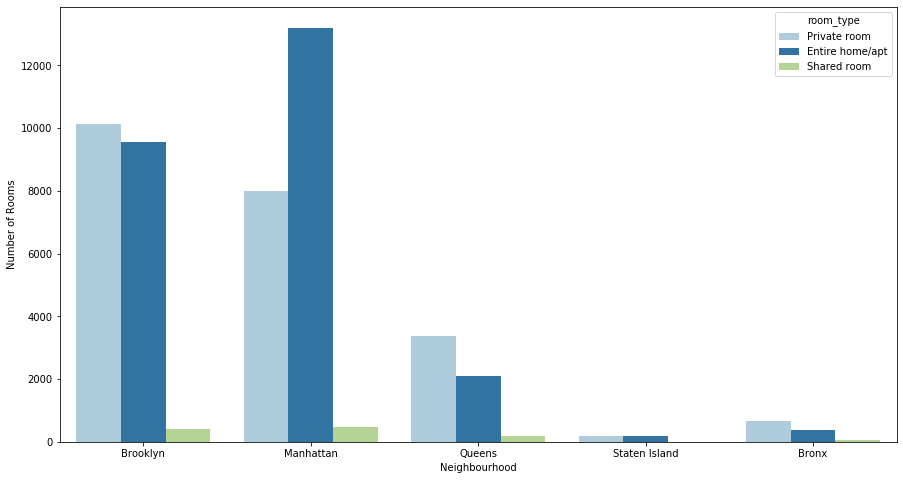

In [81]:
plt.figure(figsize=(15,8))
fig = sns.countplot(x=df['neighbourhood_group'],hue=df['room_type'],palette=sns.color_palette('Paired', n_colors=3))
plt.xlabel("Neighbourhood")
plt.ylabel("Number of Rooms")

## Neighbourhood Groups vs Price

Text(0, 0.5, 'Price')

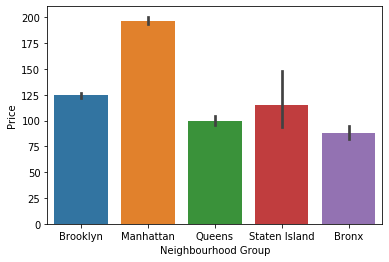

In [82]:
sns.barplot(x=df['neighbourhood_group'], y= df['price'])
plt.xlabel("Neighbourhood Group")
plt.ylabel("Price")

## Neighbourhood  vs Rooms Frequency

In [83]:
fig = px.histogram(df, x="neighbourhood",labels={"neighbourhood":"Neigbourhood"}).update_xaxes(categoryorder="total descending")
fig.update_layout(yaxis_title="Frequency")

In [84]:
#px.scatter(x=df["longitude"],y=df["latitude"], color=df["price"],alp)

## Map 

<Figure size 1080x720 with 0 Axes>

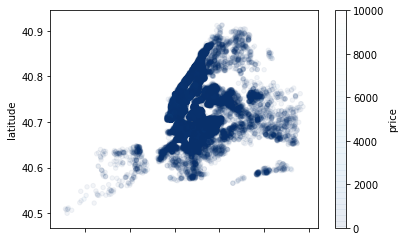

In [85]:
plt.figure(figsize=(15,10))
df.plot(kind='scatter',x='longitude', y='latitude', c='price',colorbar=True,alpha=0.05,cmap = plt.get_cmap("Blues_r"))
plt.show()

## Min Number of Nights vs Price

In [86]:
px.scatter(y=df['price'],x=df['minimum_nights'], color=df['room_type'], labels={'y': 'Price','x':'Minimum No. of Nights'})

## Min Number of Nights, Number of Reviews and Reviews Per Month vs Price

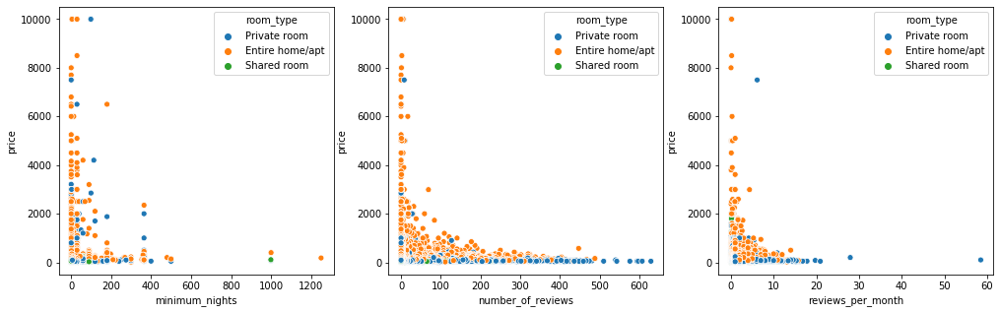

In [87]:
plt.figure(figsize=(17,5))
subplot_columns = ['minimum_nights','number_of_reviews','reviews_per_month']
for i in range(len(subplot_columns)):
    plt.subplot(1,3,i+1)
    sns.scatterplot(data=df, x=subplot_columns[i],y='price', hue='room_type')

In [88]:
man_data = df.loc[df['neighbourhood_group']=='Manhattan']

In [89]:
df[['latitude','longitude']].notnull().count()

latitude     48895
longitude    48895
dtype: int64

In [90]:
ny_map = folium.Map(location = [40.7127281, -74.0060152],tiles="stamenterrain")
mc = MarkerCluster().add_to(ny_map)

In [91]:

ny_data = df[['latitude','longitude']].values.tolist()


In [92]:
for place in range(0,len(ny_data)):
    folium.Marker(ny_data[place]).add_to(mc)

In [93]:
# Fix for folium
from IPython.display import HTML



import base64

import folium

def _repr_html_(self, **kwargs):
    html = base64.b64encode(self.render(**kwargs).encode('utf8')).decode('utf8')
    onload = (
        'this.contentDocument.open();'
        'this.contentDocument.write(atob(this.getAttribute(\'data-html\')));'
        'this.contentDocument.close();'
    )
    if self.height is None:
        iframe = (
            '<div style="width:{width};">'
            '<div style="position:relative;width:100%;height:0;padding-bottom:{ratio};">'
            '<iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;'
            'border:none !important;" '
            'data-html={html} onload="{onload}" '
            'allowfullscreen webkitallowfullscreen mozallowfullscreen>'
            '</iframe>'
            '</div></div>').format
        iframe = iframe(html=html, onload=onload, width=self.width, ratio=self.ratio)
    else:
        iframe = ('<iframe src="about:blank" width="{width}" height="{height}"'
                  'style="border:none !important;" '
                  'data-html={html} onload="{onload}" '
                  '"allowfullscreen" "webkitallowfullscreen" "mozallowfullscreen">'
                  '</iframe>').format
        iframe = iframe(html=html, onload=onload, width=self.width, height=self.height)
    return iframe

folium.branca.element.Figure._repr_html_ = _repr_html_



In [94]:
ny_map

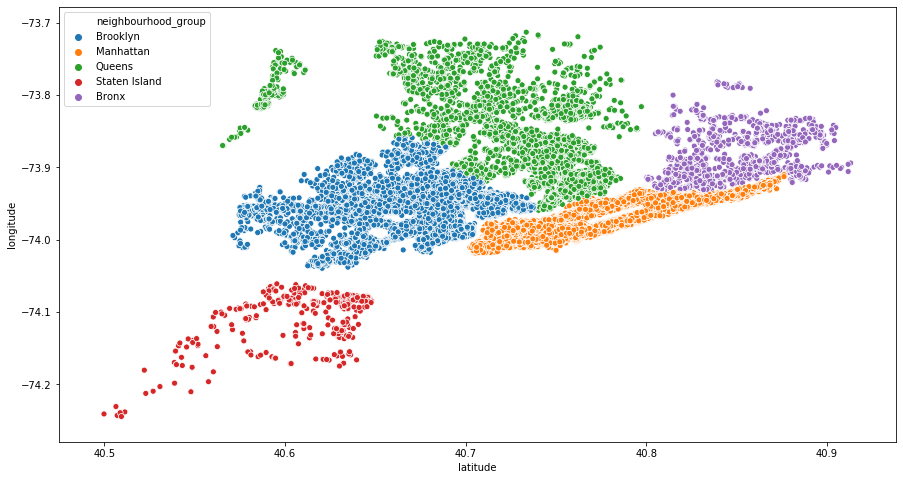

In [95]:
plt.figure(figsize=(15,8))
sns.scatterplot(data=df, x='latitude', y='longitude', hue='neighbourhood_group')

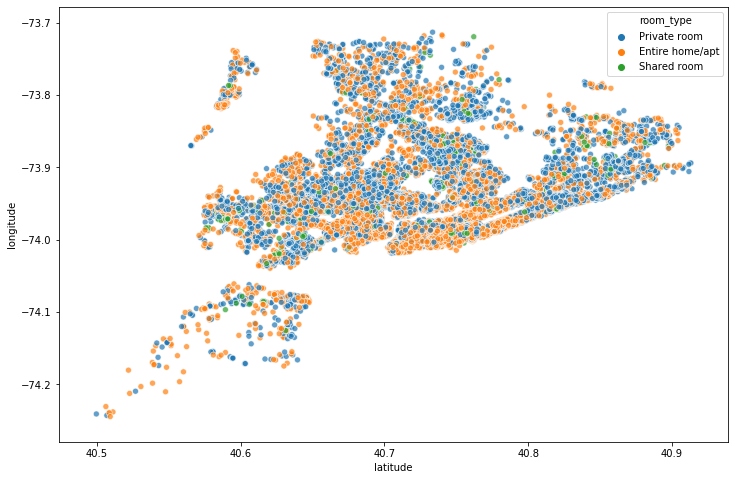

In [96]:
plt.figure(figsize=(12,8))
sns.scatterplot(x=df['latitude'],y=df['longitude'], hue=df['room_type'],alpha=0.7)

In [97]:
from IPython.display import display

In [98]:
#ny_map.save('index.html')